In [1]:
# load custom packages from src dir
import sys
sys.path.insert(0, '..')

# python packages
import logging
import os
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from tqdm import tqdm

# vit package - https://github.com/lucidrains/vit-pytorch
import vit_pytorch as vit

# custom packages
import src.commons.dataset as ds
import src.commons.constants as cons
from src.commons.modded_recorder import Recorder

# Define the logging level
logging.getLogger().setLevel(logging.INFO)

# <span style="color:green">Goals</span>

The main backbone for the Vision Transformer approcah has already been done. Now, it remains to systematically use the available routines to train models, evaluate them using the metrics defined in `src/commons/internal_metrics.py`, and report results.

However, one aspect that has not been considered so far is to study the impact of pre-trained. Is it really necessary? Can we train useful ViT models only with MVTec Data?

# Conclusions

Despite my best efforts, I couldn't find a setting where directly training on our data lead to meaningful attention masks. 

## Initialize data

Desired image transformations should be included in the `transforms.Compose` wrapper.

In [2]:
# Load dataset
cat = "hazelnut"
transf = transforms.Compose([
    transforms.Resize((80, 80)), # Resize to match TinyImagenet resolution
    transforms.Lambda(lambda T: T.long()/255) # Convert image from 0-255 uint to 0-1 long
])
data = ds.MVTECViTDataset(os.path.join(ds.current_dir(),'../', cons.DATA_PATH), cat, transforms=transf)

# Split data into train/test/val
train_data, test_data, val_data = torch.utils.data.random_split(data, [0.7, 0.2, 0.1], generator=torch.Generator().manual_seed(42))

In [3]:
# Define DataLoaders for batching input
BATCH_SIZE = 8

train_dataloader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=True)

In [4]:
# Compute positive/negative class ratio in training data

total_positives = 0
total_negatives = 0
for batch in train_dataloader:
    labels = batch["labels"]
    positive_instances = labels.sum().item()
    negative_instances = (len(labels) - positive_instances)
    total_positives += positive_instances
    total_negatives += negative_instances
class_ratio = total_negatives/total_positives
class_ratio

5.622641509433962

In [5]:
def show_img_and_mask(img, mask, ex_name):
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True)
    ax1.imshow(torch.permute(img, (1, 2, 0)))
    ax1.set_title('Raw image')
    ax2.imshow(torch.permute(img, (1, 2, 0)))
    ax2.imshow(torch.permute(mask, (1, 2, 0)), cmap="spring", alpha=0.5, vmax=mask.max()/2)
    ax2.set_title('Ground truth mask')
    fig.suptitle(ex_name)
    plt.show()

In [6]:
for sample in data:
    if ('011' in sample['class_and_id']) and ('crack' in sample['class_and_id']):
        img1, mask1, ex_name1 = sample["inputs"], sample["ground_truth"], sample['class_and_id']
    elif ('010' in sample['class_and_id']) and ('hole' in sample['class_and_id']):
        img2, mask2, ex_name2 = sample["inputs"], sample["ground_truth"], sample['class_and_id']

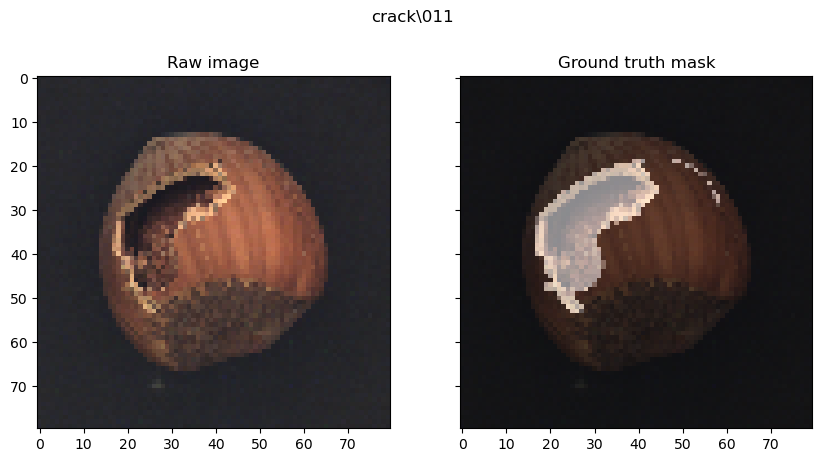

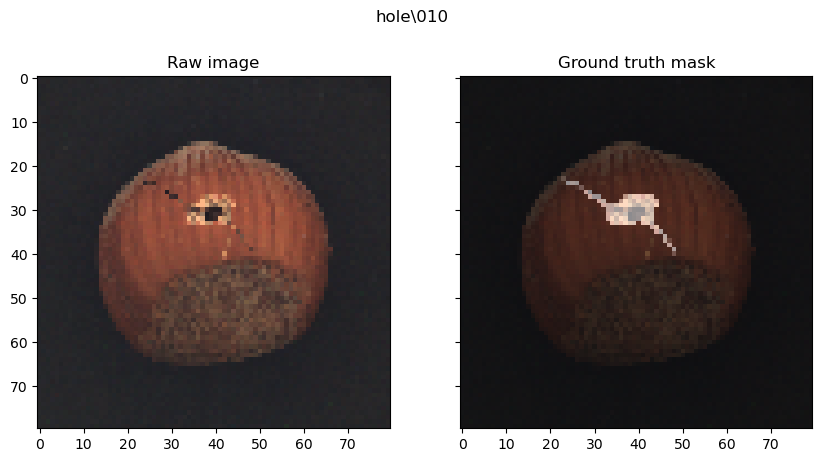

In [7]:
show_img_and_mask(img1, mask1, ex_name1)
show_img_and_mask(img2, mask2, ex_name2)

## Initialize model from scratch

In [8]:
# Pretrained model hyper-parameters
CHECKPOINT_PATH = ".." + cons.DIR_SEP + os.path.join("results")
PATCH_SIZE = 2
HIDDEN_DIM = 64

# Load pretrained model
model = vit.SimpleViT(
    image_size = 128,
    patch_size = PATCH_SIZE,
    num_classes = 1,
    dim = HIDDEN_DIM,
    depth = 1,
    heads = 8,
    mlp_dim = 128
).to("cpu")

# model.linear_head[-1] = nn.Sequential(
#     nn.Linear(HIDDEN_DIM, HIDDEN_DIM),
#     nn.ReLU(),
#     nn.Linear(HIDDEN_DIM, 1)
# )

def count_trainable_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def count_frozen_parameters(model):
    return sum(p.numel() for p in model.parameters() if not p.requires_grad)

print(f"Trainable params: {count_trainable_parameters(model)}")
print(f"Frozen params: {count_frozen_parameters(model)}")

model

Trainable params: 148929
Frozen params: 0


SimpleViT(
  (to_patch_embedding): Sequential(
    (0): Rearrange('b c (h p1) (w p2) -> b h w (p1 p2 c)', p1=2, p2=2)
    (1): Linear(in_features=12, out_features=64, bias=True)
  )
  (transformer): Transformer(
    (layers): ModuleList(
      (0): ModuleList(
        (0): Attention(
          (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=64, out_features=1536, bias=False)
          (to_out): Linear(in_features=512, out_features=64, bias=False)
        )
        (1): FeedForward(
          (net): Sequential(
            (0): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            (1): Linear(in_features=64, out_features=128, bias=True)
            (2): GELU(approximate='none')
            (3): Linear(in_features=128, out_features=64, bias=True)
          )
        )
      )
    )
  )
  (to_latent): Identity()
  (linear_head): Sequential(
    (0): LayerNorm((64,), eps=1e-05, elementwise_af

## Train from scratch

In [9]:
def evaluate(model, data_loader, **kwargs):
    loss_fn = kwargs.get("loss_fn", nn.BCEWithLogitsLoss())
    device = kwargs.get("device", torch.device("cpu"))
    
    model.eval() # set model to evaluation mode
    pbar = tqdm(enumerate(data_loader), total=len(data_loader))
    avg_loss, avg_acc = 0., 0.
    for i, batch in pbar:

        inputs, targets = batch["inputs"], batch["labels"]
        inputs, targets = inputs.to(device), targets.to(device)
        
        model.zero_grad() # initialize gradients to zero
        with torch.no_grad(): # no need to compute gradients
            logits = model(inputs)
            preds = torch.sigmoid(logits)
            pred_cats = preds > 0.5
            acc = (pred_cats == targets).float().mean()
           
        loss = loss_fn(logits, targets.float())
        avg_loss += loss.item()
        avg_acc += acc.item()
        pbar.set_description(f"loss = {loss:.3f} | acc = {acc:.3f}")
    avg_loss /= len(data_loader)
    avg_acc /= len(data_loader)
    return avg_loss, avg_acc

def fit(model, train_loader, val_loader, optimizer, **kwargs):
    loss_fn = kwargs.get("loss_fn", nn.BCEWithLogitsLoss())
    device = kwargs.get("device", torch.device("cpu"))
    num_epochs = kwargs.get("num_epochs", 100)

    train_loss_hist, val_loss_hist = [], []
    train_acc_hist, val_acc_hist = [], []

    for epoch in range(num_epochs):
        # Checkpoint if validation loss improves  
        if epoch > 2 and val_loss_hist[-2] > val_loss_hist[-1]:
            torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'loss': val_loss_hist[-1],
                    }, os.path.join(CHECKPOINT_PATH, "simple_vit_ft.pt"))

        print(f"\nEpoch {epoch + 1}/{num_epochs}")
        model.train() # set model to training mode
        train_loss, train_acc = 0., 0.
        pbar = tqdm(enumerate(train_loader), total=len(train_loader))
        for i, batch in pbar:
            
            inputs, targets = batch["inputs"], batch["labels"]
            inputs, targets = inputs.to(device), targets.to(device)
    
            # print(f"Batch - Input: {inputs.shape, type(inputs), inputs.dtype} Target: {targets.shape, type(targets), targets.dtype}")

            model.zero_grad() # initialize gradients to zero
            logits = model(inputs) # forward pass

            # print(f"Logits - {logits.shape}, {type(logits)}, {logits.dtype}")

            loss = loss_fn(logits, targets.float()) # loss computation
            loss.backward() # computing gradients (backward pass)
            
            optimizer.step() # updating the parameters of the model
            # accuracy computation
            with torch.no_grad():
                preds = torch.sigmoid(logits)
                pred_cats = preds > 0.5
                acc = (pred_cats == targets).float().mean()
    
            # pop computational graph
            train_loss += loss.item()
            train_acc += acc.item() 
            pbar.set_description(f"loss = {loss:.3f} | acc = {acc:.3f}")
        

        train_loss /= len(train_loader)
        train_acc /= len(train_loader)
        print(f"Train loss: {train_loss:.3f} | train acc = {train_acc:.3f}")
        train_loss_hist.append(train_loss)
        train_acc_hist.append(train_acc) 
        
        val_loss, val_acc = evaluate(model, val_loader, loss_fn=loss_fn, device=device)
        print(f"Validation loss: {val_loss:.3f} | val acc = {val_acc:.3f}")
        val_loss_hist.append(val_loss)
        val_acc_hist.append(val_acc)
        
    return train_loss_hist, val_loss_hist, train_acc_hist, val_acc_hist

In [12]:
# Define training parameters
LEARNING_RATE = 1e-5
NUM_EPOCHS = 20
print("BATCH SIZE: ", BATCH_SIZE)
print("CHECKPOINT PATH: ", CHECKPOINT_PATH)
print(f"Total parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) :.2e}")

# Define loss and optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

WEIGHT = torch.tensor(class_ratio) # Account for class imbalance in training data
print(f"Ratio negative/positive: {class_ratio}")
criterion = torch.nn.BCEWithLogitsLoss(pos_weight=WEIGHT)
# criterion = torch.nn.BCEWithLogitsLoss()

# Attempt training on GPU
if torch.cuda.is_available():
    DEVICE = torch.device('cuda')
# elif torch.backends.mps.is_available():
#     DEVICE = torch.device('mps')
else:
    DEVICE = torch.device('cpu')
print('DEVICE:', DEVICE)

# Send to device
model = model.to(DEVICE)
print(torch.cuda.memory_summary())

BATCH SIZE:  8
CHECKPOINT PATH:  ..\results
Total parameters: 1.49e+05
DEVICE: cuda
|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |    2941 KB |    2593 MB |  118594 MB |  118591 MB |
|       from large pool |       0 KB |    2590 MB |  118494 MB |  118494 MB |
|       from small pool |    2941 KB |       4 MB |     100 MB |      97 MB |
|---------------------------------------------------------------------------|
| Active memory         |    2941 KB |    2593 MB |  11859

In [13]:
# Training
train_loss, val_loss, train_acc, val_acc = fit(model, train_dataloader, val_dataloader, optimizer,
                                               loss_fn=criterion, num_epochs=NUM_EPOCHS, device=DEVICE)


Epoch 1/20


loss = 0.565 | acc = 1.000: 100%|██████████| 44/44 [00:14<00:00,  3.04it/s]


Train loss: 1.223 | train acc = 0.849


loss = 0.566 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.23it/s]


Validation loss: 0.863 | val acc = 0.929

Epoch 2/20


loss = 1.157 | acc = 0.857: 100%|██████████| 44/44 [00:14<00:00,  3.06it/s]


Train loss: 1.190 | train acc = 0.849


loss = 0.615 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.47it/s]


Validation loss: 0.885 | val acc = 0.929

Epoch 3/20


loss = 1.152 | acc = 0.857: 100%|██████████| 44/44 [00:14<00:00,  3.12it/s]


Train loss: 1.188 | train acc = 0.721


loss = 0.677 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.80it/s]


Validation loss: 0.914 | val acc = 0.929

Epoch 4/20


loss = 0.690 | acc = 0.857: 100%|██████████| 44/44 [00:13<00:00,  3.18it/s]


Train loss: 1.182 | train acc = 0.815


loss = 0.690 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.51it/s]


Validation loss: 0.921 | val acc = 0.875

Epoch 5/20


loss = 1.150 | acc = 0.857: 100%|██████████| 44/44 [00:13<00:00,  3.18it/s]


Train loss: 1.179 | train acc = 0.843


loss = 0.681 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.70it/s]


Validation loss: 0.916 | val acc = 0.929

Epoch 6/20


loss = 1.623 | acc = 0.714: 100%|██████████| 44/44 [00:13<00:00,  3.21it/s]


Train loss: 1.180 | train acc = 0.829


loss = 0.681 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]


Validation loss: 0.916 | val acc = 0.929

Epoch 7/20


loss = 1.149 | acc = 0.714: 100%|██████████| 44/44 [00:13<00:00,  3.16it/s]


Train loss: 1.179 | train acc = 0.840


loss = 0.691 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]


Validation loss: 0.922 | val acc = 0.786

Epoch 8/20


loss = 1.595 | acc = 0.286: 100%|██████████| 44/44 [00:13<00:00,  3.18it/s]


Train loss: 1.180 | train acc = 0.649


loss = 0.707 | acc = 0.000: 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]


Validation loss: 0.930 | val acc = 0.071

Epoch 9/20


loss = 1.152 | acc = 0.143: 100%|██████████| 44/44 [00:13<00:00,  3.21it/s]


Train loss: 1.179 | train acc = 0.154


loss = 0.709 | acc = 0.000: 100%|██████████| 7/7 [00:01<00:00,  4.79it/s]


Validation loss: 0.931 | val acc = 0.071

Epoch 10/20


loss = 0.695 | acc = 0.143: 100%|██████████| 44/44 [00:13<00:00,  3.20it/s]


Train loss: 1.177 | train acc = 0.438


loss = 0.695 | acc = 0.500: 100%|██████████| 7/7 [00:01<00:00,  4.64it/s]


Validation loss: 0.923 | val acc = 0.268

Epoch 11/20


loss = 0.697 | acc = 0.000: 100%|██████████| 44/44 [00:13<00:00,  3.20it/s]


Train loss: 1.177 | train acc = 0.463


loss = 0.699 | acc = 0.000: 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]


Validation loss: 0.925 | val acc = 0.071

Epoch 12/20


loss = 1.151 | acc = 0.857: 100%|██████████| 44/44 [00:13<00:00,  3.19it/s]


Train loss: 1.178 | train acc = 0.494


loss = 0.691 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.61it/s]


Validation loss: 0.921 | val acc = 0.911

Epoch 13/20


loss = 1.150 | acc = 0.857: 100%|██████████| 44/44 [00:13<00:00,  3.18it/s]


Train loss: 1.180 | train acc = 0.315


loss = 0.683 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]


Validation loss: 0.917 | val acc = 0.929

Epoch 14/20


loss = 1.634 | acc = 0.714: 100%|██████████| 44/44 [00:13<00:00,  3.21it/s]


Train loss: 1.181 | train acc = 0.849


loss = 0.668 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]


Validation loss: 0.909 | val acc = 0.929

Epoch 15/20


loss = 0.699 | acc = 0.000: 100%|██████████| 44/44 [00:13<00:00,  3.20it/s]


Train loss: 1.177 | train acc = 0.287


loss = 0.700 | acc = 0.000: 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]


Validation loss: 0.926 | val acc = 0.071

Epoch 16/20


loss = 1.152 | acc = 0.143: 100%|██████████| 44/44 [00:13<00:00,  3.23it/s]


Train loss: 1.178 | train acc = 0.151


loss = 0.701 | acc = 0.000: 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]


Validation loss: 0.926 | val acc = 0.071

Epoch 17/20


loss = 2.096 | acc = 0.571: 100%|██████████| 44/44 [00:13<00:00,  3.18it/s]


Train loss: 1.184 | train acc = 0.780


loss = 0.680 | acc = 1.000: 100%|██████████| 7/7 [00:01<00:00,  4.76it/s]


Validation loss: 0.915 | val acc = 0.929

Epoch 18/20


loss = 0.707 | acc = 0.000: 100%|██████████| 44/44 [00:14<00:00,  3.14it/s]


Train loss: 1.176 | train acc = 0.222


loss = 0.706 | acc = 0.000: 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]


Validation loss: 0.928 | val acc = 0.071

Epoch 19/20


loss = 1.152 | acc = 0.143: 100%|██████████| 44/44 [00:15<00:00,  2.88it/s]


Train loss: 1.178 | train acc = 0.588


loss = 0.700 | acc = 0.000: 100%|██████████| 7/7 [00:02<00:00,  3.32it/s]


Validation loss: 0.925 | val acc = 0.071

Epoch 20/20


loss = 0.693 | acc = 0.714: 100%|██████████| 44/44 [00:18<00:00,  2.44it/s]


Train loss: 1.182 | train acc = 0.726


loss = 0.696 | acc = 0.000: 100%|██████████| 7/7 [00:02<00:00,  3.28it/s]

Validation loss: 0.923 | val acc = 0.071


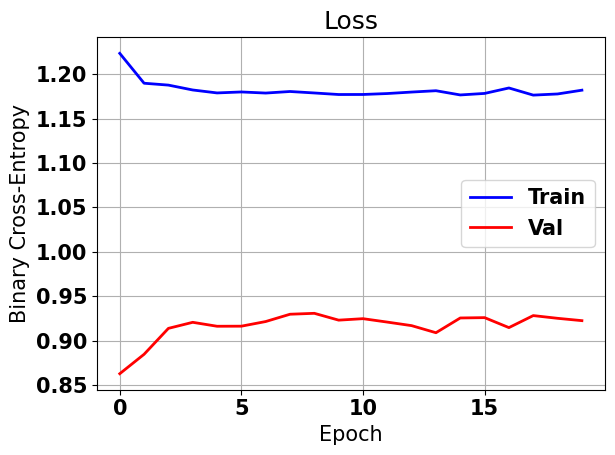

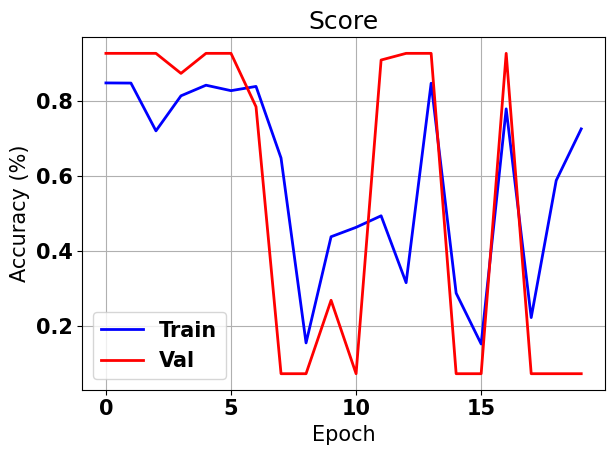

In [14]:
# Plot loss and accuracy
with plt.rc_context(rc={'font.size': 15, 'font.weight': 'bold'}):
    plt.figure()
    plt.title("Loss")
    plt.plot(train_loss, lw=2.0, c="b", label="Train")
    plt.plot(val_loss, lw=2.0, c="r", label="Val")
    plt.xlabel("Epoch")
    plt.ylabel("Binary Cross-Entropy")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()
    ####
    plt.figure()
    plt.title("Score")
    plt.plot(train_acc, lw=2.0, c="b", label="Train")
    plt.plot(val_acc, lw=2.0, c="r", label="Val")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

In [15]:
# Visualize attention layers
def predict_with_attention(model, data_loader, **kwargs):
    device = kwargs.get("device", torch.device("cpu"))

    images, labels, results, attn_weights = [], [], [], []

    model.eval() # set model to evaluation mode
    pbar = tqdm(enumerate(data_loader), total=len(data_loader))
    for i, batch in pbar:

        data, targets = batch["inputs"], batch["labels"]
        data, targets = data.to(device), targets.to(device)
        
        model.zero_grad() # initialize gradients to zero
        with torch.no_grad(): # no need to compute gradients
            logits, attns = model(data) # attns: (batch x layers x heads x patch x patch)
            preds = torch.sigmoid(logits)
            pred_cats = preds > 0.5

        attns = attns.mean(dim=2) # average over heads
        attns_prod = attns[:, 0] # recursively multiply attentions
        for i in range(1, attns.shape[1]):
            attns_prod = torch.matmul(attns_prod, attns[:, i])

        images.append(data)
        labels.append(targets)
        results.append(pred_cats)
        attn_weights.append(attns_prod)

    images = torch.concat(tuple([image for image in images]), dim=0)
    labels = torch.concat(tuple([label for label in labels]))
    results = torch.concat(tuple([result for result in results]))
    attn_weights = torch.concat(tuple([attn for attn in attn_weights]))

    return images, labels, results, attn_weights

In [19]:
# Pretrained model hyper-parameters
CHECKPOINT_PATH = ".." + cons.DIR_SEP + os.path.join("results")
PATCH_SIZE = 2
HIDDEN_DIM = 64

# Load pretrained model
model = vit.SimpleViT(
    image_size = 128,
    patch_size = PATCH_SIZE,
    num_classes = 1,
    dim = HIDDEN_DIM,
    depth = 1,
    heads = 8,
    mlp_dim = 128
).to("cuda")


loaded = torch.load(os.path.join(CHECKPOINT_PATH, "simple_vit_ft.pt"))
print(f"Loaded model, epoch:{loaded['epoch']}, loss:{loaded['loss']}")
model.load_state_dict(loaded["model_state_dict"])


model = Recorder(model) # set up model to return attention weights in forward pass
images, labels, pred_cats, attns = predict_with_attention(model, train_dataloader)
model = model.eject() # remove hooks from forward pass


print(images.shape, labels.shape, pred_cats.shape, attns.shape)

Loaded model, epoch:19, loss:0.9252287064279828


100%|██████████| 44/44 [01:33<00:00,  2.12s/it]


torch.Size([351, 3, 80, 80]) torch.Size([351, 1]) torch.Size([351, 1]) torch.Size([351, 1600, 1600])


In [21]:
%matplotlib inline
# Refs: https://www.kaggle.com/code/piantic/vision-transformer-vit-visualize-attention-map/notebook

def plot_attentions(images, labels, pred_Cats, attns, start_idx=0, n_rows=5):
    fig, ax = plt.subplots(1, n_rows, figsize=(8, 3))
    with plt.rc_context(rc={'font.size': 9}):
        for i in range(start_idx, start_idx + 5):
            ca = ax[i % 5]
            # Plot correct predictions for anomalous objects
            img = images[i]
            img_label = labels[i]
            pred_label = pred_cats[i]
            resize = transforms.Resize((80, 80))
            
            attns_raw = attns[i]
            attns_vals = attns_raw[-1]
            mask = attns_vals.reshape(40, 40)
            mask = resize(mask.unsqueeze(0)).squeeze()
            mask = mask.detach().numpy()
            mask = (mask - mask.min())/(mask.max() - mask.min())

            img_perm = torch.permute(img, (1, 2, 0)).cpu().numpy()
            ca.imshow(img_perm, aspect="auto")
            ca.imshow(mask, aspect="auto", alpha=0.6, cmap="viridis")
        
            if pred_label.int().item() == img_label.item():
                ca.set_title(f"{pred_label.int().item()} / {img_label.item()}", color="green")
            else:
                ca.set_title(f"{pred_label.int().item()} / {img_label.item()}", color="red")

            ca.set_axis_off()
        
        fig.tight_layout()

C:\Users\fcoel\AppData\Local\Temp\ipykernel_11772\2865007193.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, n_rows, figsize=(8, 3))


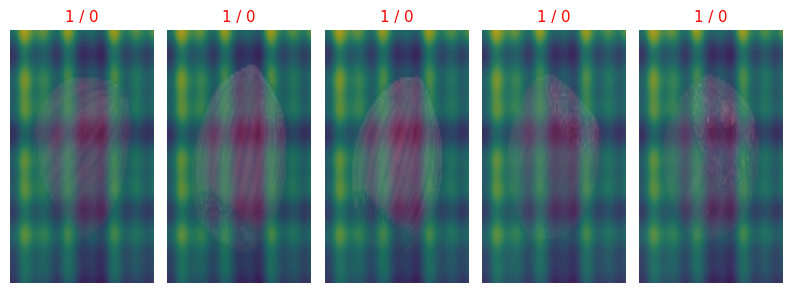

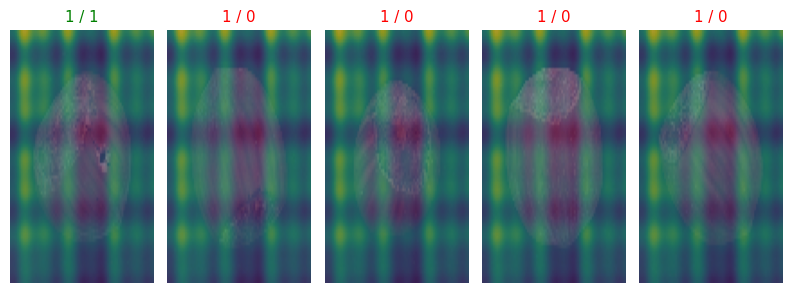

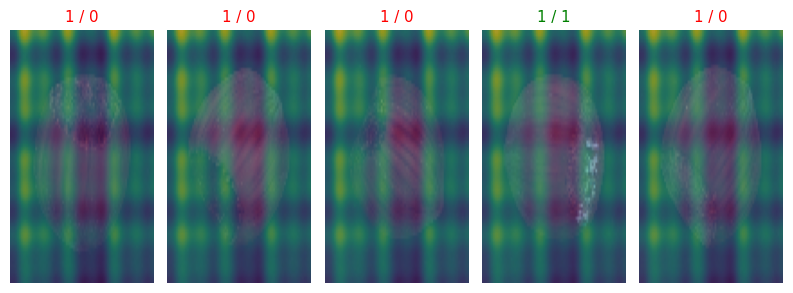

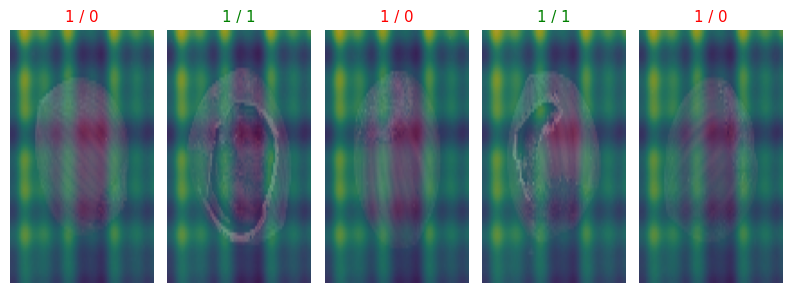

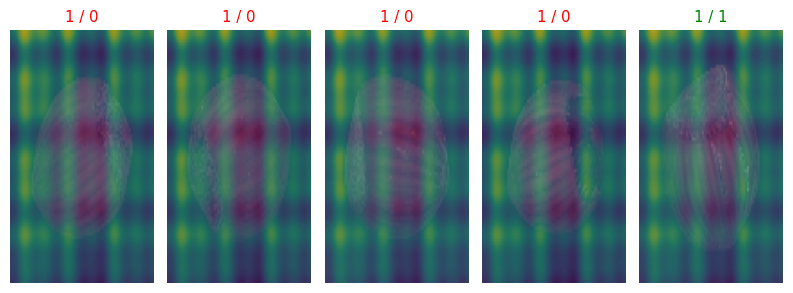

...

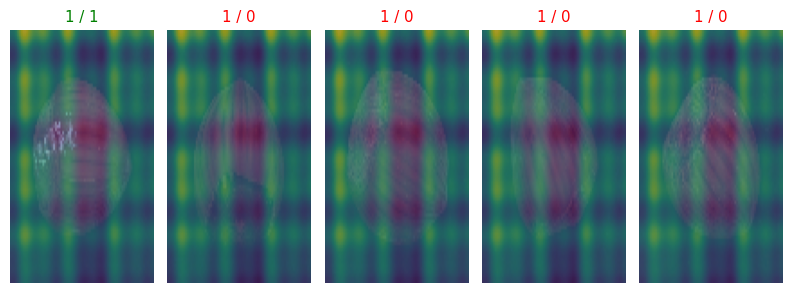

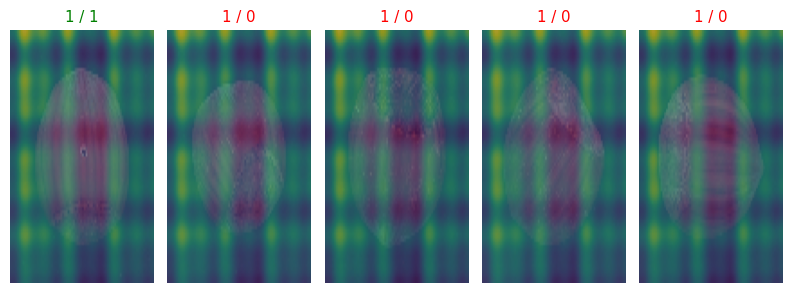

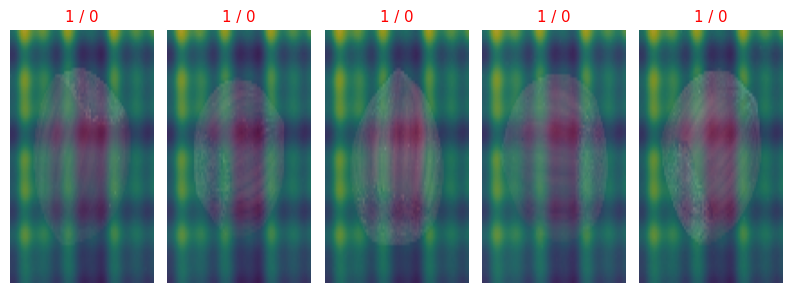

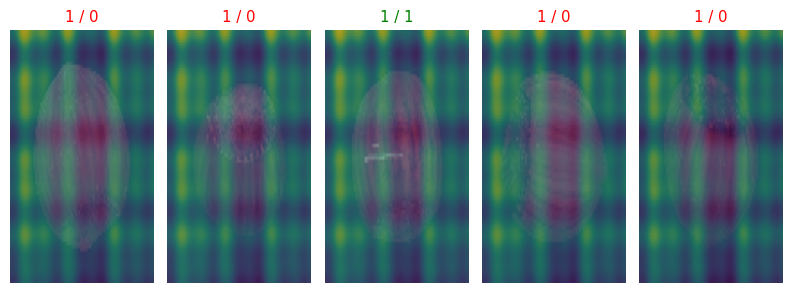

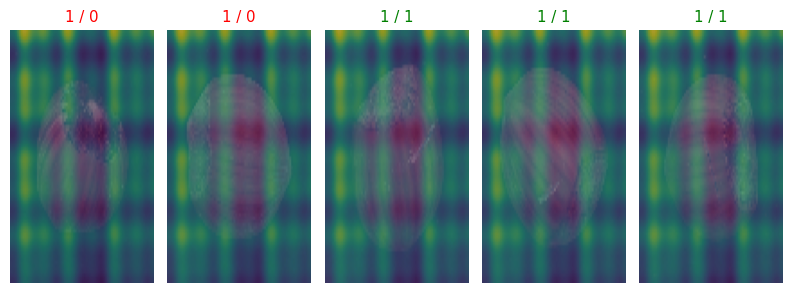

In [22]:
for i in range(0, images.shape[0]-1, 5):
    plot_attentions(images, labels, pred_cats, attns, start_idx=i)